<h2><b>Project Akhir</b></h2>

<table align="left">
    <tr>
        <td style="text-align:left">Kode Mata Kuliah</td>
        <td style="text-align:left">:</td>
        <td style="text-align:left">12S3205</td>
    </tr>
    <tr>
        <td style="text-align:left">Nama Mata Kuliah</td>
        <td style="text-align:left">:</td>
        <td style="text-align:left">Data Mining</td>
    </tr>
    <tr>
        <td style="text-align:left">Case 4</td>
        <td style="text-align:left">:</td>
        <td style="text-align:left"><i>Location-based species presence
prediction</i></td>
    </tr>
    <tr>
        <td style="text-align:left">Kelompok 5</td>
        <td style="text-align:left">:</td>
        <td style="text-align:left">
            <ul style="margin:0; padding-left:15px;">
                <li><i>12S22032 – Samuel Janring Sitio</i></li>
                <li><i>12S22033 – Mickael Heri Sintompul</i></li>
                <li><i>12S22035 – Brain Wondeson Sitorus</i></li>
            </ul>
        </td>
    </tr>
</table>


# Data Understanding


### Presence-Absence (PA) surveys

In [ ]:
import pandas as pd
import numpy as np
import  seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import   train_test_split
from sklearn.preprocessing import  StandardScaler
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix, precision_score , recall_score, classification_report

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


####  Import dan Load Data

In [ ]:
  # Presence-Absence
df_PA = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/csv_GeoLifeCLEF 2025/GLC25_PA_metadata_train.csv')
# Presence-Only (Updated file name)
df_PO = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/csv_GeoLifeCLEF 2025/GLC25_P0_metadata_train.csv')

In [ ]:
  df_PA.head()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId
0,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,6874.0,212
1,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,476.0,212
2,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,11157.0,212
3,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,8784.0,212
4,3.099038,43.134956,2021,5.0,100.0,MEDITERRANEAN,France,4530.0,212


In [ ]:
df_PA.tail()

,lon,lat,year,geoUncertaintyInM,areaInM2,region,country,speciesId,surveyId
1483632,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,53.0,3919655
1483633,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,5071.0,3919655
1483634,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,1889.0,3919655
1483635,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,10600.0,3919655
1483636,9.91398,56.82758,2018,10.0,707.0,CONTINENTAL,Denmark,963.0,3919655


#### Statistik Deskriptif

In [ ]:
df_PA.describe()

,lon,lat,year,geoUncertaintyInM,areaInM2,speciesId,surveyId
count,1.483637e+06,1.483637e+06,1.483637e+06,1.471141e+06,1300365.0,1.483637e+06,1.483637e+06
mean,9.024850e+00,5.242552e+01,2.018179e+03,7.483046e+00,-inf,5.811442e+03,1.969927e+06
std,4.437247e+00,4.853112e+00,1.094525e+00,6.190821e+00,NaN,3.392812e+03,1.135967e+06
min,-9.018346e+00,3.511705e+01,2.017000e+03,0.000000e+00,-inf,2.000000e+00,2.120000e+02
25%,6.052593e+00,4.856769e+01,2.017000e+03,3.000000e+00,25.0,2.847000e+03,9.768390e+05
50%,9.380850e+00,5.515287e+01,2.018000e+03,1.000000e+01,79.0,6.079000e+03,1.976273e+06
75%,1.041882e+01,5.626047e+01,2.019000e+03,1.000000e+01,79.0,8.818000e+03,2.960059e+06
max,2.915421e+01,5.989300e+01,2.021000e+03,1.000000e+02,8000.0,1.125400e+04,3.919655e+06


In [ ]:
df_PA.shape

(1483637, 9)

In [ ]:
df_PA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1483637 entries, 0 to 1483636
Data columns (total 9 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   lon                1483637 non-null  float64
 1   lat                1483637 non-null  float64
 2   year               1483637 non-null  int64  
 3   geoUncertaintyInM  1471141 non-null  float64
 4   areaInM2           1300365 non-null  float64
 5   region             1483637 non-null  object 
 6   country            1483637 non-null  object 
 7   speciesId          1483637 non-null  float64
 8   surveyId           1483637 non-null  int64  
dtypes: float64(5), int64(2), object(2)
memory usage: 101.9+ MB


#### Missing Values

In [ ]:
print(df_PA.isnull().sum())

print(df_PA.duplicated().sum())

# Mengecek nilai unik di setiap kolom
for col in df_PA.columns:
    print(f"{col}: {df_PA[col].nunique()} nilai unik")


lon                       0
lat                       0
year                      0
geoUncertaintyInM     12496
areaInM2             183272
region                    0
country                   0
speciesId                 0
surveyId                  0
dtype: int64
20378
lon: 84157 nilai unik
lat: 82932 nilai unik
year: 5 nilai unik
geoUncertaintyInM: 29 nilai unik
areaInM2: 345 nilai unik
region: 8 nilai unik
country: 29 nilai unik
speciesId: 5016 nilai unik
surveyId: 88987 nilai unik


##### Distribusi Lokasi

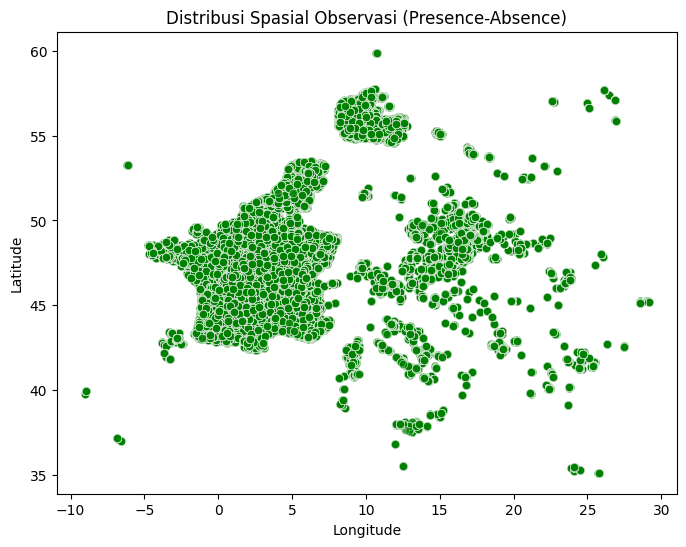

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='lon', y='lat', data=df_PA, alpha=0.4, color='green')
plt.title('Distribusi Spasial Observasi (Presence-Absence)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

**Penjelasan :** Plot ini menunjukkan sebaran lokasi pengamatan (presence atau absence) pada data `df_PA` di seluruh wilayah Eropa. Warna hijau dengan transparansi (alpha=0.4) digunakan untuk memvisualisasikan banyaknya observasi, sehingga area yang lebih padat akan tampak lebih gelap. Hal ini membantu mengidentifikasi area dengan konsentrasi pengamatan yang tinggi maupun rendah secara spasial.

##### Distribusi Tahun dan Bulan

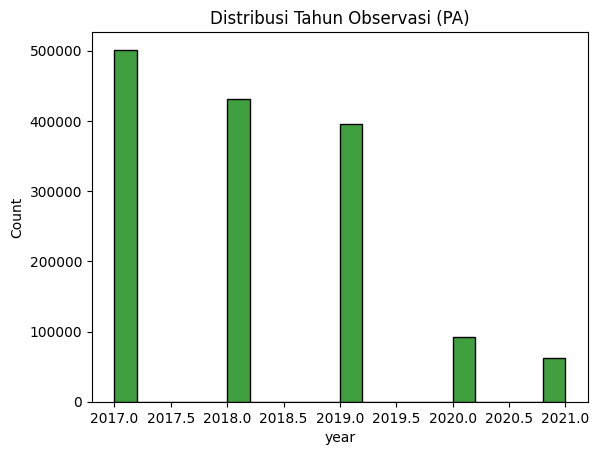

In [ ]:
sns.histplot(df_PA['year'].dropna(), bins=20, kde=False, color='green')
plt.title('Distribusi Tahun Observasi (PA)')
plt.show()

**Penjelasan :** Histogram ini menggambarkan tren peningkatan jumlah observasi dari tahun ke tahun, dimulai dari 2017 hingga 2021. Terlihat bahwa jumlah observasi meningkat secara signifikan, dengan puncaknya terjadi pada tahun 2021. Hal ini bisa menunjukkan adanya peningkatan aktivitas pengumpulan data atau kemajuan dalam sistem pencatatan dan pelaporan pada tahun-tahun terakhir.

##### Distribusi Kolom Numerik

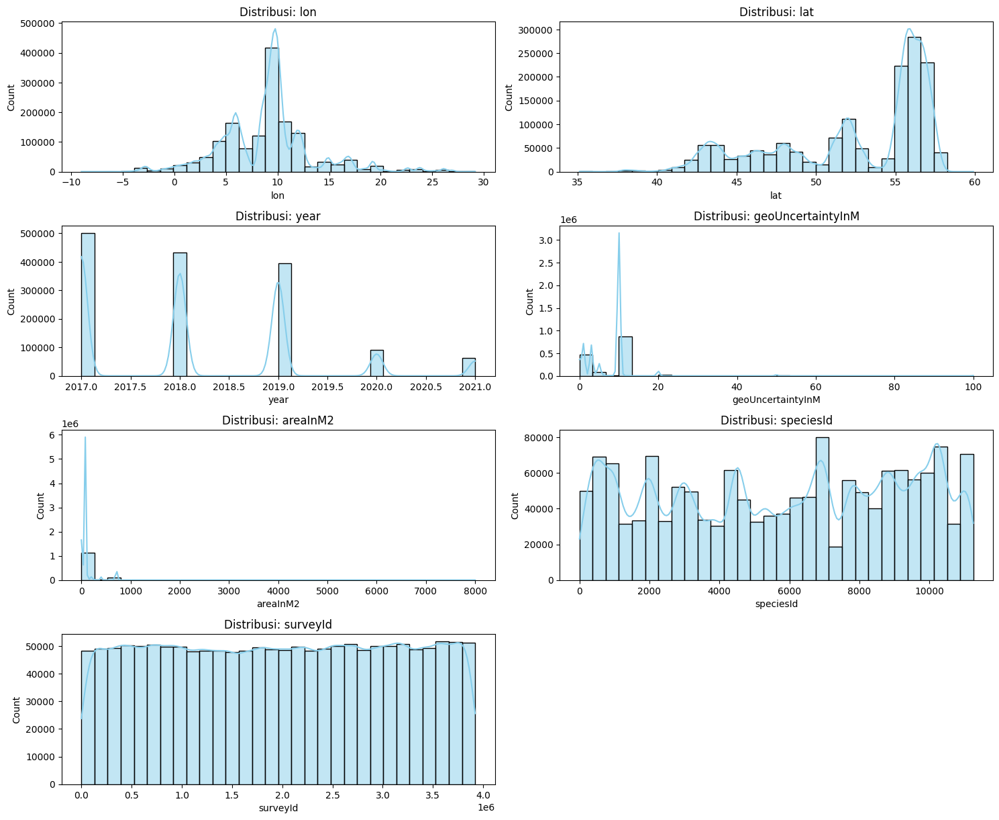

In [ ]:
numeric_cols_PA = df_PA.select_dtypes(include=np.number).columns

plt.figure(figsize=(15, len(numeric_cols_PA)*3))
for i, col in enumerate(numeric_cols_PA, 1):
    plt.subplot(len(numeric_cols_PA), 2, i)
    sns.histplot(df_PA[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribusi: {col}')
plt.tight_layout()
plt.show()

**Penjelasan:**

Beberapa pola penting yang bisa diamati:

* **lon dan lat**: Distribusi spasial observasi terkonsentrasi pada lintang sekitar 45–60 dan bujur 0–20, menunjukkan mayoritas data dikumpulkan dari wilayah geografis spesifik, kemungkinan besar Eropa.

* **year**: Terjadi lonjakan observasi pada tahun-tahun tertentu seperti 2017, 2018, dan 2019. Ini menunjukkan bahwa pengumpulan data tidak dilakukan secara merata setiap tahun.

* **geoUncertaintyInM dan arealInM2**: Kedua variabel ini menunjukkan distribusi yang sangat miring ke kiri. Mayoritas titik observasi memiliki ketidakpastian geografis dan luasan area yang kecil, tetapi ada beberapa outlier dengan nilai sangat tinggi.

* **speciesId dan surveyId**: Kedua variabel ini memiliki distribusi yang relatif merata, yang menunjukkan cakupan spesies dan survei yang cukup luas dan tidak terlalu didominasi oleh kelompok tertentu.


#####  **Boxplot untuk Presence-Absence (PA)**

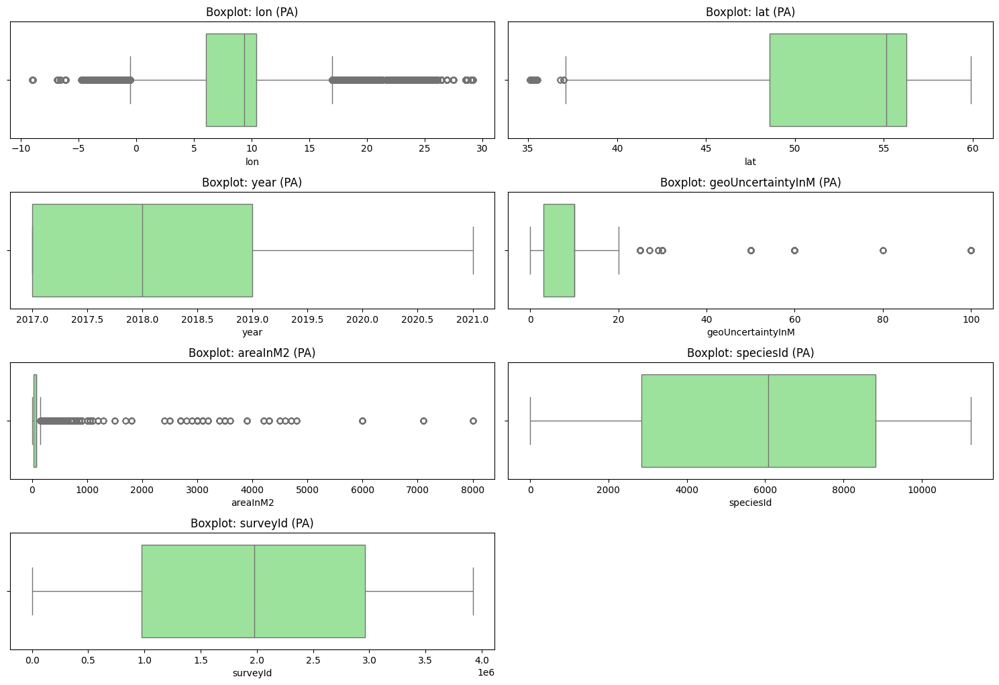

In [ ]:
numeric_cols_PA = df_PA.select_dtypes(include=np.number).columns

plt.figure(figsize=(15, len(numeric_cols_PA)*2.5))
for i, col in enumerate(numeric_cols_PA, 1):
    plt.subplot(len(numeric_cols_PA), 2, i)
    sns.boxplot(data=df_PA, x=col, color='lightgreen')
    plt.title(f'Boxplot: {col} (PA)')
plt.tight_layout()
plt.show()

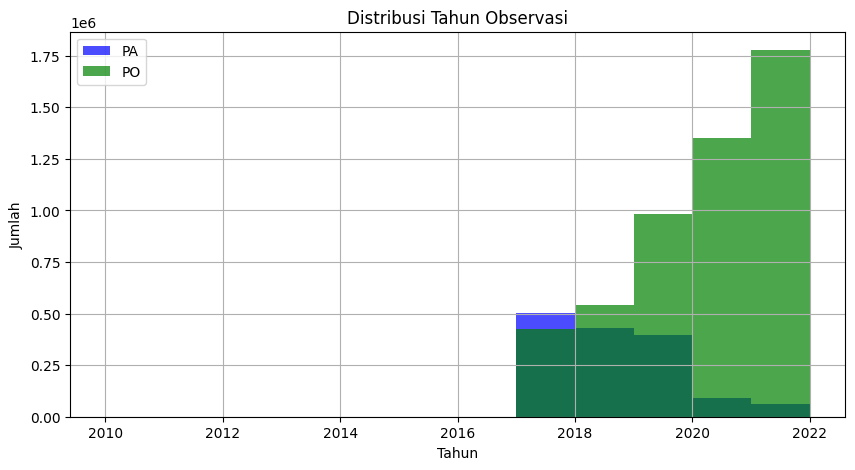

In [ ]:
plt.figure(figsize=(10, 5))
plt.hist(df_PA['year'], bins=range(2010, 2023), alpha=0.7, label='PA', color='blue')
plt.hist(df_PO['year'], bins=range(2010, 2023), alpha=0.7, label='PO', color='green')
plt.title("Distribusi Tahun Observasi")
plt.xlabel("Tahun")
plt.ylabel("Jumlah")
plt.legend()
plt.grid(True)
plt.show()


In [1]:
import folium

# Pastikan jumlah sampel tidak melebihi jumlah baris aktual
n_sample = min(10000, len(df_PA))
subset = df_PA.sample(n=n_sample, random_state=42)

# Buat peta dasar
m = folium.Map(location=[subset['lat'].mean(), subset['lon'].mean()], zoom_start=5)

# Tambahkan CircleMarker
for _, row in subset.iterrows():
    popup_info = f"Species ID: {row['speciesId']}<br>Year: {row['year']}<br>Area: {row['areaInM2']} m²"
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        color='green',
        fill=True,
        fill_opacity=0.5,
        popup=popup_info
    ).add_to(m)

m


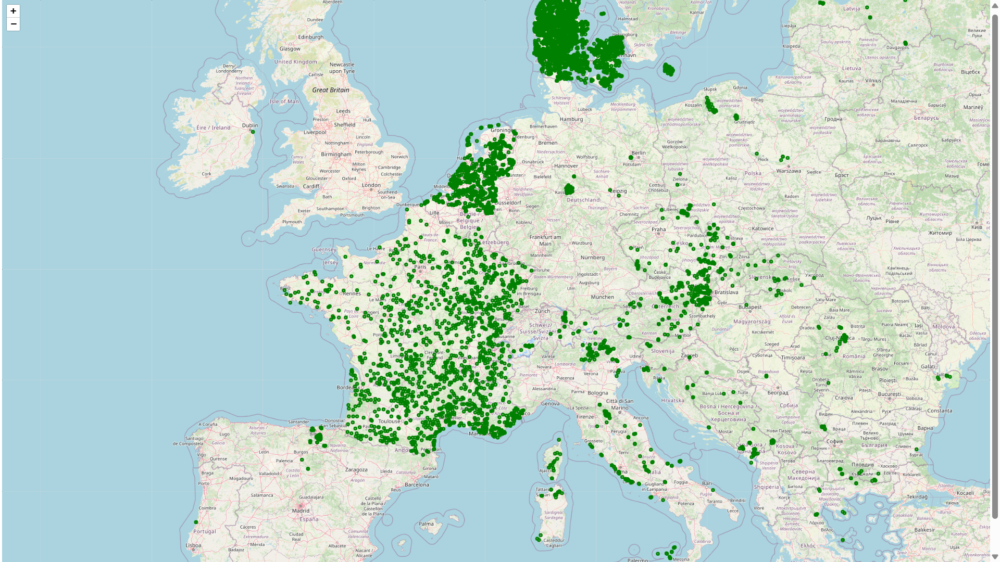

Peta itu adalah representasi spasial dari lokasi-lokasi observasi yang akan digunakan untuk melatih dan menguji model prediksi distribusi spesies tanaman.

##### Korelasi & Heatmap

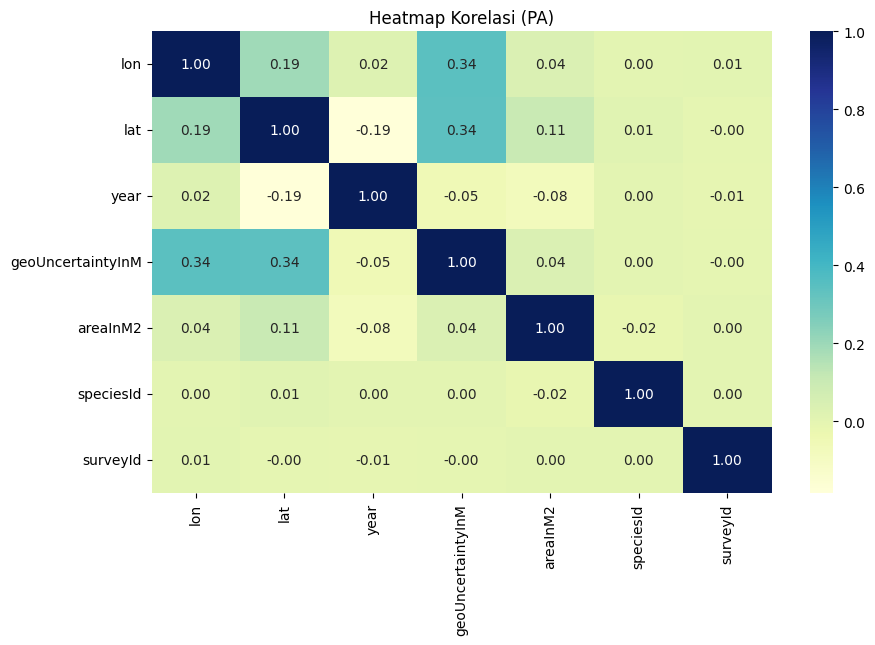

In [ ]:
corr_matrix_PA = df_PA[numeric_cols_PA].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix_PA, annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Heatmap Korelasi (PA)')
plt.show()

### Presence-Only (PO) occurrences

In [ ]:
# pada data P0
df_PO.head()

,publisher,year,month,day,lat,lon,geoUncertaintyInM,taxonRank,date,dayOfYear,speciesId,surveyId
0,Pl@ntNet,2019,5.0,5.0,43.74605,1.573057,6.0,SPECIES,2019-05-05,125,3383.0,1
1,Pl@ntNet,2021,3.0,17.0,42.12559,0.314948,5.0,SPECIES,2021-03-17,76,1152.0,2
2,Pl@ntNet,2021,6.0,5.0,48.29520,-0.934518,24.9,SPECIES,2021-06-05,156,6772.0,3
3,iNaturalist.org,2021,6.0,9.0,53.63367,-2.644535,8.0,SPECIES,2021-06-09,160,3318.0,4
4,iNaturalist.org,2021,4.0,1.0,49.79471,7.925086,15.0,SPECIES,2021-04-01,91,3374.0,5


##### Statistik Deskriptif

In [ ]:
df_PO.describe()

,year,month,day,lat,lon,geoUncertaintyInM,dayOfYear,speciesId,surveyId
count,5.079797e+06,5.079313e+06,5.077978e+06,5.079797e+06,5.079797e+06,5.079797e+06,5.079797e+06,5.079797e+06,5.079797e+06
mean,2.019691e+03,6.668166e+00,1.587809e+01,5.093416e+01,7.200107e+00,1.960271e+01,1.874085e+02,5.548289e+03,1.958906e+06
std,1.276998e+00,2.055715e+00,8.849674e+00,6.327424e+00,6.459158e+00,2.061601e+01,6.251571e+01,3.265986e+03,1.131119e+06
min,2.017000e+03,1.000000e+00,1.000000e+00,3.456858e+01,-1.053904e+01,1.000000e-02,1.000000e+00,0.000000e+00,1.000000e+00
25%,2.019000e+03,5.000000e+00,8.000000e+00,4.622206e+01,3.031679e+00,5.000000e+00,1.450000e+02,2.703000e+03,9.795300e+05
50%,2.020000e+03,7.000000e+00,1.600000e+01,5.087179e+01,8.156571e+00,1.000000e+01,1.850000e+02,5.499000e+03,1.957783e+06
75%,2.021000e+03,8.000000e+00,2.400000e+01,5.592847e+01,1.103426e+01,2.500000e+01,2.310000e+02,8.424000e+03,2.938109e+06
max,2.021000e+03,1.200000e+01,3.100000e+01,7.118392e+01,3.455792e+01,9.800000e+01,3.660000e+02,1.125400e+04,3.919662e+06


In [ ]:
df_PO.shape

(5079797, 12)

In [ ]:
df_PO.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5079797 entries, 0 to 5079796
Data columns (total 12 columns):
 #   Column             Dtype  
---  ------             -----  
 0   publisher          object 
 1   year               int64  
 2   month              float64
 3   day                float64
 4   lat                float64
 5   lon                float64
 6   geoUncertaintyInM  float64
 7   taxonRank          object 
 8   date               object 
 9   dayOfYear          int64  
 10  speciesId          float64
 11  surveyId           int64  
dtypes: float64(6), int64(3), object(3)
memory usage: 465.1+ MB


##### Missing Values

In [ ]:
print(df_PO.isnull().sum())

print(df_PO.duplicated().sum())

# Mengecek nilai unik di setiap kolom
for col in df_PO.columns:
    print(f"{col}: {df_PO[col].nunique()} nilai unik")


publisher               0
year                    0
month                 484
day                  1819
lat                     0
lon                     0
geoUncertaintyInM       0
taxonRank               0
date                    0
dayOfYear               0
speciesId               0
surveyId                0
dtype: int64
67685
publisher: 12 nilai unik
year: 5 nilai unik
month: 12 nilai unik
day: 31 nilai unik
lat: 1661348 nilai unik
lon: 2975166 nilai unik
geoUncertaintyInM: 9746 nilai unik
taxonRank: 2 nilai unik
date: 1826 nilai unik
dayOfYear: 366 nilai unik
speciesId: 9709 nilai unik
surveyId: 3845533 nilai unik


##### Distribusi Lokasi

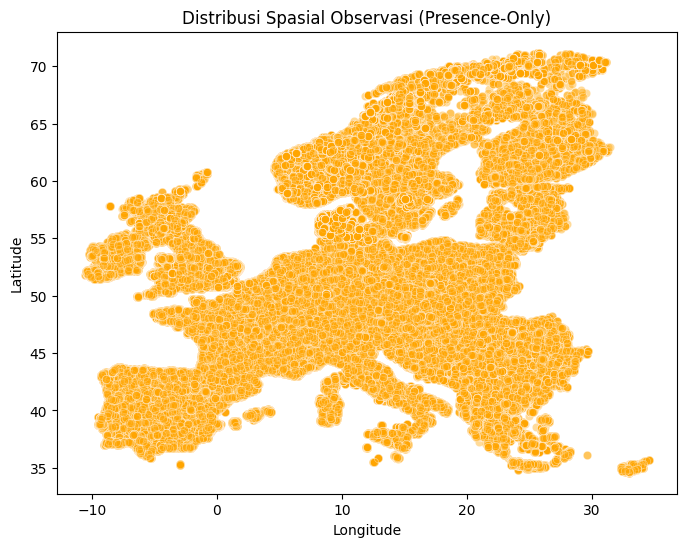

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='lon', y='lat', data=df_PO, alpha=0.4, color='orange')
plt.title('Distribusi Spasial Observasi (Presence-Only)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

##### Distribusi Tahun

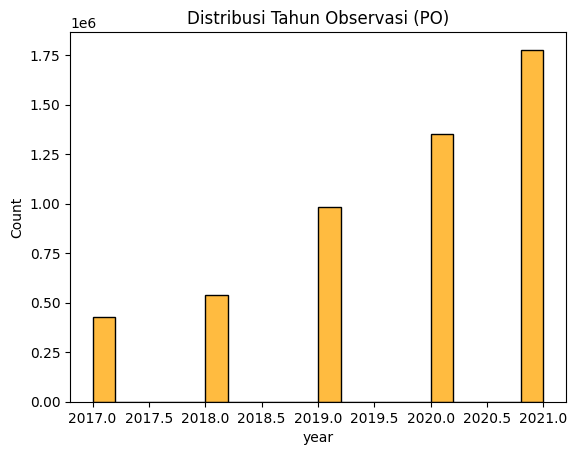

In [ ]:
sns.histplot(df_PO['year'].dropna(), bins=20, kde=False, color='orange')
plt.title('Distribusi Tahun Observasi (PO)')
plt.show()

##### Distribusi Kolom Numerik

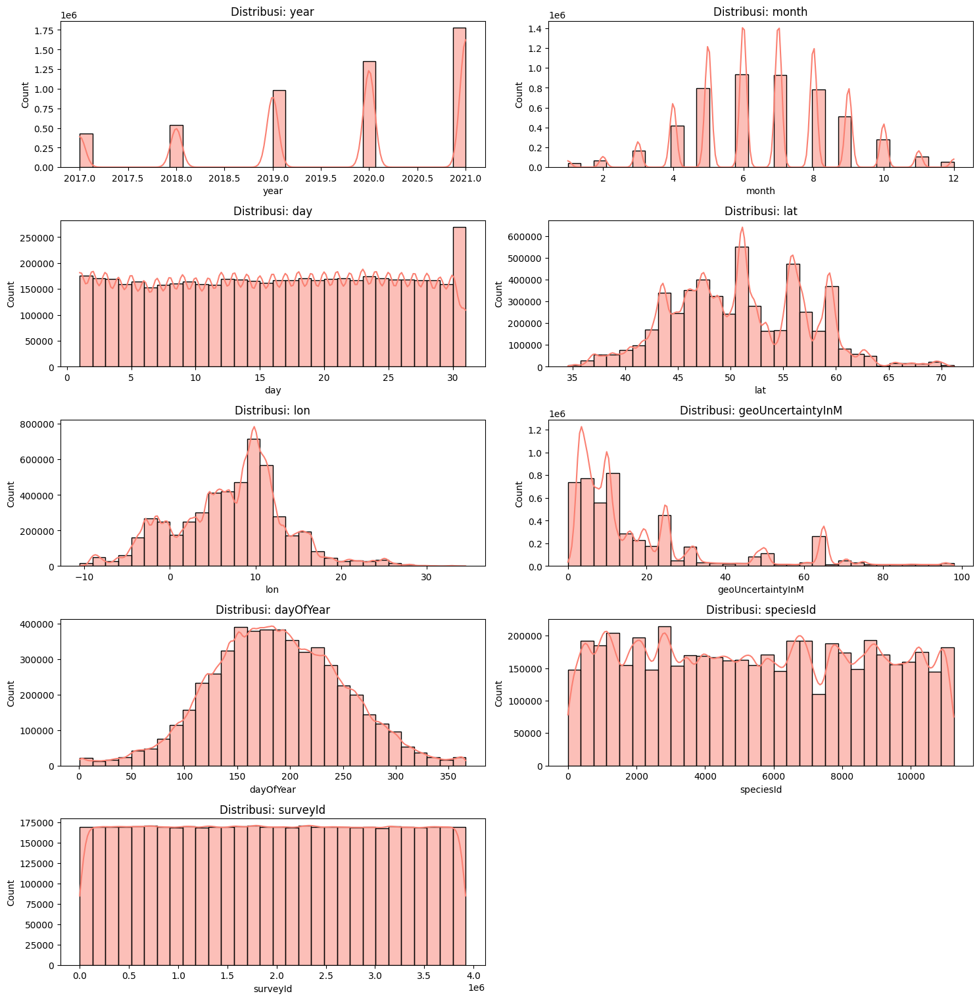

In [ ]:
numeric_cols_PO = df_PO.select_dtypes(include=np.number).columns

plt.figure(figsize=(15, len(numeric_cols_PO)*3))
for i, col in enumerate(numeric_cols_PO, 1):
    plt.subplot(len(numeric_cols_PO), 2, i)
    sns.histplot(df_PO[col], kde=True, bins=30, color='salmon')
    plt.title(f'Distribusi: {col}')
plt.tight_layout()
plt.show()

##### Boxplot untuk Presence-Only (PO)

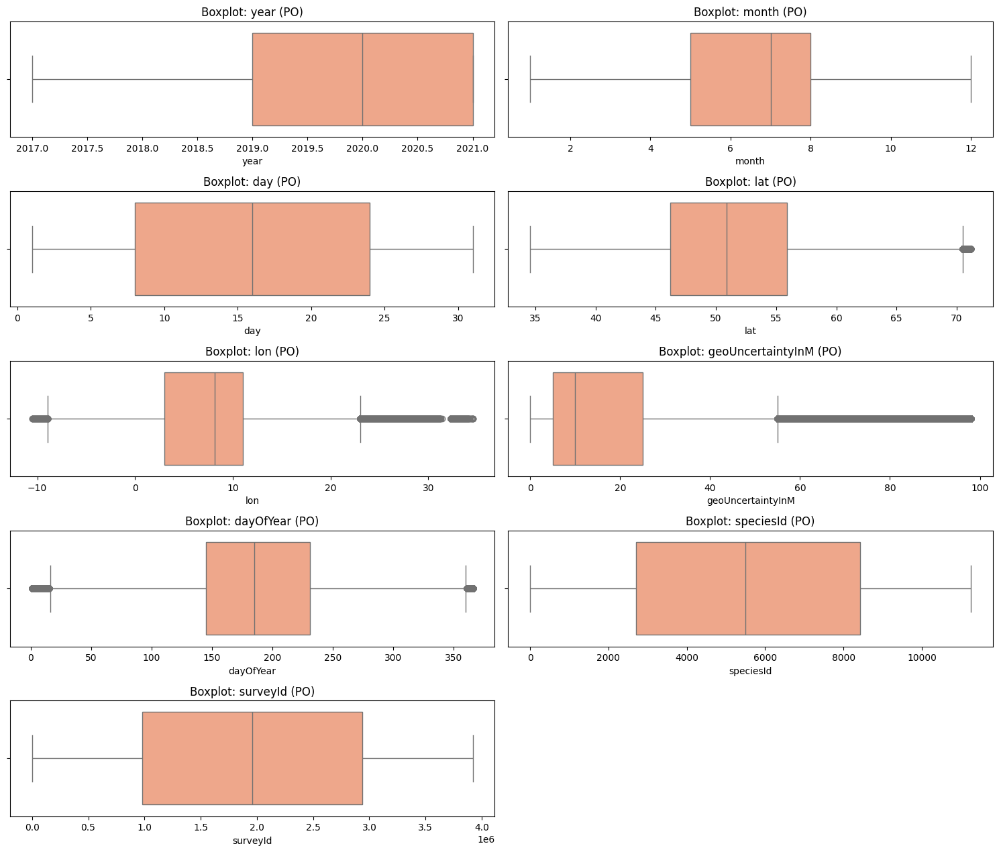

In [ ]:
numeric_cols_PO = df_PO.select_dtypes(include=np.number).columns

plt.figure(figsize=(15, len(numeric_cols_PO)*2.5))
for i, col in enumerate(numeric_cols_PO, 1):
    plt.subplot(len(numeric_cols_PO), 2, i)
    sns.boxplot(data=df_PO, x=col, color='lightsalmon')
    plt.title(f'Boxplot: {col} (PO)')
plt.tight_layout()
plt.show()

In [ ]:
numeric_cols = df_PO.select_dtypes(include=np.number)

corr_matrix = numeric_cols.corr()

print("Matriks Korelasi:")
print(corr_matrix)


Matriks Korelasi:
                       year     month       day       lat       lon  \
year               1.000000 -0.071849 -0.007169 -0.258431 -0.072505   
month             -0.071849  1.000000 -0.101153  0.124361  0.058758   
day               -0.007169 -0.101153  1.000000 -0.002907 -0.005587   
lat               -0.258431  0.124361 -0.002907  1.000000  0.357664   
lon               -0.072505  0.058758 -0.005587  0.357664  1.000000   
geoUncertaintyInM  0.041574 -0.073033 -0.006864 -0.081901 -0.020214   
dayOfYear         -0.071571  0.990004  0.039804  0.124044  0.057862   
speciesId         -0.010285  0.005331  0.000483 -0.009224 -0.002113   
surveyId           0.001500  0.000890  0.001194 -0.000448  0.000436   

                   geoUncertaintyInM  dayOfYear  speciesId  surveyId  
year                        0.041574  -0.071571  -0.010285  0.001500  
month                      -0.073033   0.990004   0.005331  0.000890  
day                        -0.006864   0.039804   0.000483

In [2]:
import folium
import pandas as pd

# Misal kamu sudah punya data PO
# df_PO = pd.read_csv("path_ke_file_PO.csv")

# Atau kalau sudah di memori, lanjut:
# Gunakan subset jika datanya besar
subset_po = df_PO.sample(n=min(5000, len(df_PO)), random_state=42)


# Buat peta awal
m_po = folium.Map(location=[subset_po['lat'].mean(), subset_po['lon'].mean()], zoom_start=5)

# Tambahkan titik lokasi
for _, row in subset_po.iterrows():
    popup_info = f"""
    Species ID: {row['speciesId']}<br>
    Date: {row['year']}-{row.get('month', '')}-{row.get('day', '')}<br>
    Uncertainty: {row['geoUncertaintyInM']} m
    """
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=popup_info
    ).add_to(m_po)

# Tampilkan peta
m_po


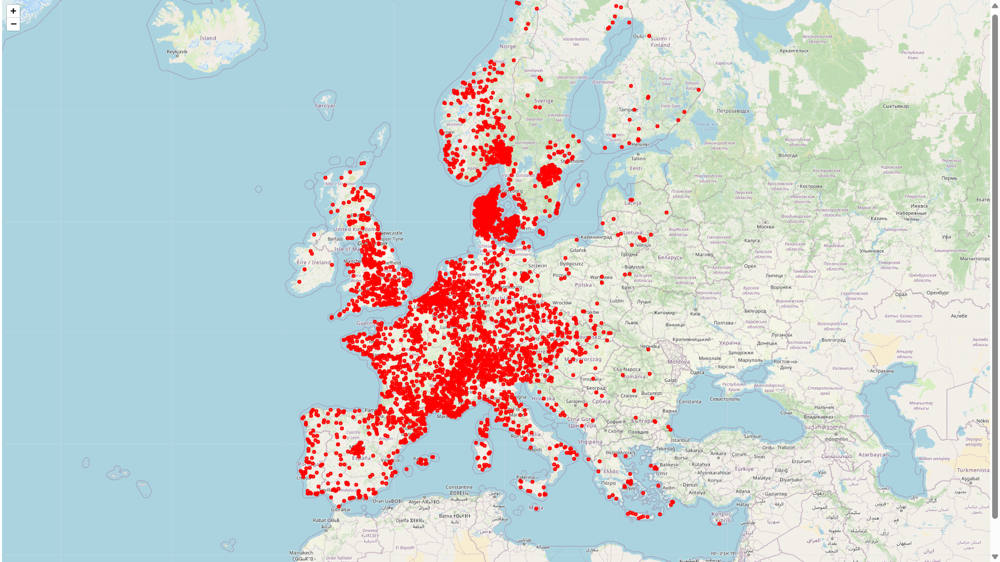

##### Korelasi & Heatmap

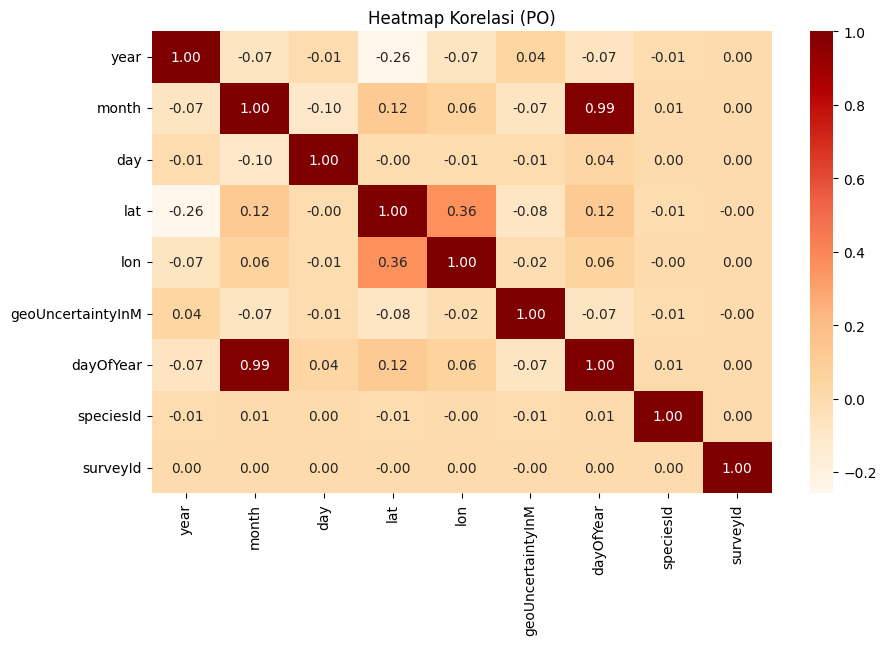

In [ ]:
corr_matrix_PO = df_PO[numeric_cols_PO].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix_PO, annot=True, cmap='OrRd', fmt='.2f')
plt.title('Heatmap Korelasi (PO)')
plt.show()

# **Data Preparation**

#### **Memilah Data (Data Selection)**

In [ ]:
import pandas as pd

# Load PO dan PA
df_PA = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/csv_GeoLifeCLEF 2025/GLC25_PA_metadata_train.csv')
df_PO = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/csv_GeoLifeCLEF 2025/GLC25_P0_metadata_train.csv')

# Ambil kolom yang kita perlukan dari PO
po_selected = df_PO[['lat', 'lon', 'year', 'speciesId', 'surveyId']]

# Ambil kolom yang kita perlukan dari PA
pa_selected = df_PA[['lat', 'lon', 'year', 'speciesId', 'surveyId']]

# Simpan hasil pemilahan
po_selected.to_csv("PO_selected.csv", index=False)
pa_selected.to_csv("PA_selected.csv", index=False)

print("✅ PO_selected.csv dan PA_selected.csv berhasil disimpan.")

✅ PO_selected.csv dan PA_selected.csv berhasil disimpan.


In [ ]:
po_selected.head()



,lat,lon,year,speciesId,surveyId
0,43.74605,1.573057,2019,3383.0,1
1,42.12559,0.314948,2021,1152.0,2
2,48.29520,-0.934518,2021,6772.0,3
3,53.63367,-2.644535,2021,3318.0,4
4,49.79471,7.925086,2021,3374.0,5


In [ ]:
pa_selected.head()

,lat,lon,year,speciesId,surveyId
0,43.134956,3.099038,2021,6874.0,212
1,43.134956,3.099038,2021,476.0,212
2,43.134956,3.099038,2021,11157.0,212
3,43.134956,3.099038,2021,8784.0,212
4,43.134956,3.099038,2021,4530.0,212


#### **Membersihkan Data (Data Cleaning)**

In [ ]:
ximport pandas as pd

# === 1. Load hasil dari tahap sebelumnya ===
PO_df = pd.read_csv('/content/PO_selected.csv')
PA_df = pd.read_csv('/content/PA_selected.csv')

# === 2. Hapus duplikasi ===
po_df_clean = PO_df.drop_duplicates()
pa_df_clean = PA_df.drop_duplicates()

# === 3. Cek & tangani missing values ===
print("📌 Missing values PO:\n", po_df_clean.isnull().sum())
print("📌 Missing values PA:\n", pa_df_clean.isnull().sum())

# Drop rows yang memiliki nilai NaN
po_df_clean = po_df_clean.dropna()
pa_df_clean = pa_df_clean.dropna()

# === 4. Filter nilai latitude & longitude yang tidak valid ===
po_df_clean = po_df_clean[(po_df_clean['lat'].between(-90, 90)) & (po_df_clean['lon'].between(-180, 180))]
pa_df_clean = pa_df_clean[(pa_df_clean['lat'].between(-90, 90)) & (pa_df_clean['lon'].between(-180, 180))]

# === 5. Simpan hasil cleaning ===
po_df_clean.to_csv("PO_clean.csv", index=False)
pa_df_clean.to_csv("PA_clean.csv", index=False)

print("✅ Data cleaning selesai. File PO_clean.csv dan PA_clean.csv berhasil disimpan.")

📌 Missing values PO:
 lat          0
lon          0
year         0
speciesId    0
surveyId     0
dtype: int64
📌 Missing values PA:
 lat          0
lon          0
year         0
speciesId    0
surveyId     0
dtype: int64
✅ Data cleaning selesai. File PO_clean.csv dan PA_clean.csv berhasil disimpan.


In [ ]:
po_df_clean.head()

,lat,lon,year,speciesId,surveyId
0,43.74605,1.573057,2019,3383.0,1
1,42.12559,0.314948,2021,1152.0,2
2,48.29520,-0.934518,2021,6772.0,3
3,53.63367,-2.644535,2021,3318.0,4
4,49.79471,7.925086,2021,3374.0,5


In [ ]:
pa_df_clean.head()

,lat,lon,year,speciesId,surveyId
0,43.134956,3.099038,2021,6874.0,212
1,43.134956,3.099038,2021,476.0,212
2,43.134956,3.099038,2021,11157.0,212
3,43.134956,3.099038,2021,8784.0,212
4,43.134956,3.099038,2021,4530.0,212


#### **Mengkonstruksi Data**

In [ ]:
import pandas as pd

# Load hasil cleaning
PO = pd.read_csv('/content/PO_clean.csv')
PA = pd.read_csv('/content/PA_clean.csv')

# Tambahkan kolom 'source' untuk membedakan
PO['source'] = 'PO'
PA['source'] = 'PA'

# Gabungkan
combined_df = pd.concat([PO, PA], ignore_index=True)

# Simpan gabungan awal
combined_df.to_csv("combined_location_data.csv", index=False)

print("✅ PO dan PA berhasil digabungkan. File: combined_location_data.csv")

✅ PO dan PA berhasil digabungkan. File: combined_location_data.csv


In [ ]:
combined_df.head()

,lat,lon,year,speciesId,surveyId,source
0,43.74605,1.573057,2019,3383.0,1,PO
1,42.12559,0.314948,2021,1152.0,2,PO
2,48.29520,-0.934518,2021,6772.0,3,PO
3,53.63367,-2.644535,2021,3318.0,4,PO
4,49.79471,7.925086,2021,3374.0,5,PO


In [ ]:
import pandas as pd

# Load dataset gabungan metadata PO + PA
combined_df = pd.read_csv('/content/combined_location_data.csv')

# Load fitur Elevation PA dan PO
pa_elevation = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/csv_GeoLifeCLEF 2025/GLC25-PA-train-elevation.csv')  # kolom: surveyId, Elevation
po_elevation = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/csv_GeoLifeCLEF 2025/GLC25-PO-train-elevation.csv')  # kolom: surveyId, Elevation

# Rename kolom Elevation supaya tidak bentrok saat merge
pa_elevation = pa_elevation.rename(columns={'Elevation': 'Elevation_PA'})
po_elevation = po_elevation.rename(columns={'Elevation': 'Elevation_PO'})

# Merge Elevation PA dan PO ke combined_df berdasarkan surveyId
combined_df = combined_df.merge(pa_elevation, on='surveyId', how='left')
combined_df = combined_df.merge(po_elevation, on='surveyId', how='left')

# Buat kolom final 'Elevation' berdasarkan source (PO atau PA)
combined_df['Elevation'] = combined_df.apply(
    lambda row: row['Elevation_PA'] if row['source'] == 'PA' else row['Elevation_PO'],
    axis=1
)

# Hapus kolom Elevation_PA dan Elevation_PO agar bersih
combined_df_elevation = combined_df.drop(columns=['Elevation_PA', 'Elevation_PO'])

# Simpan hasil akhir
combined_df_elevation.to_csv("combined_with_elevation.csv", index=False)

print("✅ Elevation dari PO dan PA berhasil digabung ke dataset gabungan.")


✅ Elevation dari PO dan PA berhasil digabung ke dataset gabungan.


In [ ]:
print(combined_df_elevation.head())

        lat       lon  year  speciesId  surveyId source  Elevation
0  43.74605  1.573057  2019     3383.0         1     PO      184.0
1  42.12559  0.314948  2021     1152.0         2     PO      464.0
2  48.29520 -0.934518  2021     6772.0         3     PO      139.0
3  53.63367 -2.644535  2021     3318.0         4     PO       97.0
4  49.79471  7.925086  2021     3374.0         5     PO      156.0


#### **Menentukan Label Data (Label Definition)**

Langkah ini bertujuan untuk menambahkan kolom **label** pada data gabungan PO dan PA sebagai bagian dari persiapan supervised learning. Kolom label akan digunakan sebagai target variabel dalam model klasifikasi spesies.

* Untuk data **Presence-Only (PO)**, semua entri dianggap sebagai kehadiran spesies, sehingga diberi label `1`.
* Untuk data **Presence-Absence (PA)**, semua entri yang tercatat sebagai kehadiran juga diberi label `1`, sementara entri lain nantinya akan ditentukan sebagai **absence** dengan label `0` pada tahap selanjutnya, berdasarkan informasi tambahan.

Berikut cuplikan kode dan hasil penambahan label awal:

In [ ]:
import pandas as pd

# Load data gabungan PO dan PA + Elevation
df = pd.read_csv('/content/combined_with_elevation.csv')

# Tambahkan kolom label:
# - PO: label = 1 (kehadiran)
# - PA: label = 1 (kehadiran), sisanya akan ditentukan nanti sebagai 0
df['label'] = df['source'].apply(lambda x: 1 if x == 'PO' else 1)

# Tampilkan sampel data dengan label
print("🔹 Contoh data setelah penambahan label awal:")
print(df.head())


🔹 Contoh data setelah penambahan label awal:
        lat       lon  year  speciesId  surveyId source  Elevation  label
0  43.74605  1.573057  2019     3383.0         1     PO      184.0      1
1  42.12559  0.314948  2021     1152.0         2     PO      464.0      1
2  48.29520 -0.934518  2021     6772.0         3     PO      139.0      1
3  53.63367 -2.644535  2021     3318.0         4     PO       97.0      1
4  49.79471  7.925086  2021     3374.0         5     PO      156.0      1


#### **Mengintegrasikan Data (PA hadir + PA tidak hadir + PO)**

In [ ]:
# Filter data PA
pa_df = df[df['source'] == 'PA']

# Ambil 100 unique surveyId dan speciesId
unique_survey_ids = pa_df['surveyId'].unique()[:100]
unique_species_ids = pa_df['speciesId'].unique()[:100]

# Buat semua kombinasi surveyId × speciesId
all_pa_combinations = (
    pd.MultiIndex.from_product([unique_survey_ids, unique_species_ids], names=['surveyId', 'speciesId'])
    .to_frame(index=False)
)

# Identifikasi kombinasi yang tidak ada di data PA (absence)
pa_present = pa_df[['surveyId', 'speciesId']].drop_duplicates()
pa_absent = all_pa_combinations.merge(pa_present, on=['surveyId', 'speciesId'], how='left', indicator=True)
pa_absent = pa_absent[pa_absent['_merge'] == 'left_only'].drop(columns=['_merge'])

# Tambahkan metadata lokasi dan tahun dari surveyId
survey_meta = pa_df[['surveyId', 'lat', 'lon', 'year', 'Elevation']].drop_duplicates()
pa_absent = pa_absent.merge(survey_meta, on='surveyId', how='left')

# Beri label 0 untuk absence dan tambahkan kolom source
pa_absent['label'] = 0
pa_absent['source'] = 'PA'

# Sesuaikan urutan kolom
cols_order = ['surveyId', 'speciesId', 'lat', 'lon', 'year', 'Elevation', 'label', 'source']
pa_absent = pa_absent[cols_order]

# Gabungkan dengan data awal (yang label=1)
labeled_present = df[cols_order]
combined_labeled_df = pd.concat([labeled_present, pa_absent], ignore_index=True)

# Simpan ke file
combined_labeled_df.to_csv("combined_labeled_with_elevation.csv", index=False)

# Tampilkan hasil sampel akhir
print("✅ Data berhasil diintegrasikan dan disimpan sebagai 'combined_labeled_with_elevation.csv'.")
print("\n🔹 Contoh data gabungan akhir:")
print(combined_labeled_df.head())


✅ Data berhasil diintegrasikan dan disimpan sebagai 'combined_labeled_with_elevation.csv'.

🔹 Contoh data gabungan akhir:
   surveyId  speciesId       lat       lon  year  Elevation  label source
0         1     3383.0  43.74605  1.573057  2019      184.0      1     PO
1         2     1152.0  42.12559  0.314948  2021      464.0      1     PO
2         3     6772.0  48.29520 -0.934518  2021      139.0      1     PO
3         4     3318.0  53.63367 -2.644535  2021       97.0      1     PO
4         5     3374.0  49.79471  7.925086  2021      156.0      1     PO


# **Modeling**

## Membangun Skenario Pengujian

🎯 Tujuan:

Di tahap ini, kami membangun model untuk memprediksi apakah suatu lokasi kemungkinan memiliki spesies tanaman tertentu atau tidak. Data yang kami gunakan berasal dari dua sumber utama: **Presence-Only (PO)** dan **Presence-Absence (PA)**.

* **Data PA** memberikan informasi lengkap, termasuk lokasi di mana spesies tidak ditemukan (label 0).
* Sementara **data PO** hanya menunjukkan lokasi di mana spesies ditemukan (label 1), tanpa info lokasi ketidakhadiran.

Karena data PO hanya punya label 1, ini menyebabkan ketidakseimbangan kelas saat digabung dengan PA. Supaya model tidak "berpihak" pada data mayoritas, kami menggunakan teknik **SMOTE (Synthetic Minority Over-sampling Technique)** untuk menambahkan contoh sintetik dari kelas minoritas (label 0). Ini membantu model belajar dengan lebih seimbang.

Beberapa fitur yang kami gunakan untuk pelatihan model adalah:

* Koordinat geografis (lat dan lon)
* Elevasi (ketinggian tempat)
* Tahun pengamatan
* Sumber data (PA atau PO), yang kami ubah ke format numerik agar bisa digunakan oleh model

---

🎯 Modeling:
#### Algoritma dan Pembagian Data

Kami memilih **Random Forest Classifier** sebagai algoritma utama. Alasan utamanya karena model ini cukup tangguh untuk menangani data tabular yang kompleks, dan dia juga bisa menunjukkan fitur mana yang paling berpengaruh dalam proses pengambilan keputusan.

Data kami bagi menjadi dua bagian:

* **Data latih (training)** untuk mengajarkan model
* **Data uji (testing)** untuk mengevaluasi performa model terhadap data yang belum pernah dilihat


#### Evaluasi Model

Setelah model selesai dilatih, kami melakukan evaluasi dengan beberapa cara:

1. **Confusion Matrix**
   Memberikan gambaran berapa banyak prediksi model yang benar dan salah, baik untuk kelas 1 (spesies hadir) maupun kelas 0 (tidak hadir).

2. **Classification Report**
   Di sini kami melihat metrik seperti precision, recall, dan F1-score untuk tiap kelas. Ini membantu kami mengukur seberapa akurat model dalam membedakan kedua jenis lokasi.

3. **ROC Curve dan AUC Score**
   ROC Curve menunjukkan seberapa baik model membedakan antara kelas 1 dan 0. Sementara AUC (Area Under Curve) memberi nilai keseluruhan dari performa model—semakin mendekati 1, semakin baik.

Kami juga melakukan **5-fold cross-validation** agar hasil evaluasi tidak hanya bergantung pada satu pembagian data. Artinya, kami melatih dan menguji model lima kali dengan kombinasi data yang berbeda, lalu mengambil rata-ratanya. Ini memberi gambaran seberapa stabil performa model di berbagai kondisi.

#### Analisis Feature Importance

Salah satu hal menarik dari Random Forest adalah kita bisa tahu fitur mana yang paling mempengaruhi prediksi. Misalnya, apakah elevasi lebih penting dibandingkan koordinat lokasi? Atau apakah sumber data (PA atau PO) punya pengaruh besar?

Kami visualisasikan hasil ini dalam grafik batang, jadi bisa langsung kelihatan fitur apa yang paling dominan dalam menentukan keberadaan spesies.


#### Visualisasi Hasil

**1. Peta Interaktif dengan Folium**
Kami ingin melihat secara langsung lokasi spesies yang diprediksi oleh model, jadi kami buat peta interaktif.

* Titik **hijau** menunjukkan lokasi dengan prediksi spesies hadir
* Titik **merah** menunjukkan lokasi dengan prediksi spesies tidak hadir

Semua titik dikelompokkan secara otomatis dalam *cluster* agar tampilannya tetap rapi dan tidak terlalu padat.

**2. Scatter Plot Lokasi Hasil Prediksi**
Kami juga memvisualisasikan hasil prediksi model dalam bentuk scatter plot berdasarkan longitude dan latitude. Titik-titik diberi warna sesuai hasil prediksi, jadi kita bisa lihat pola geografis dari prediksi model.

**3. Plot Sebaran Lokasi Asli**
Selain prediksi, kami juga ingin tahu bagaimana sebenarnya sebaran data PO dan PA di lapangan. Maka kami buat plot terpisah:

* Warna **hijau** untuk lokasi yang benar-benar ada spesiesnya
* Warna **biru** untuk lokasi yang tidak ada spesiesnya

Visualisasi ini penting untuk membandingkan apakah model berhasil menangkap pola dari data asli atau tidak.



#### Penyimpanan Model

Setelah semua proses selesai, kami menyimpan model yang sudah dilatih agar bisa digunakan lagi di masa depan, tanpa harus melatih ulang dari awal.

* Model disimpan dalam format `.pkl` menggunakan `joblib`
* Kami juga menyimpan *scaler* (yang digunakan untuk normalisasi data sebelum masuk ke model), agar proses prediksi berikutnya tetap konsisten
---

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import accuracy_score, f1_score, hamming_loss
import matplotlib.pyplot as plt

In [ ]:
# Load dataset
df = pd.read_csv('/content/combined_labeled_with_elevation.csv')
df.head()

,surveyId,speciesId,lat,lon,year,Elevation,label,source
0,1,3383.0,43.74605,1.573057,2019,184.0,1,PO
1,2,1152.0,42.12559,0.314948,2021,464.0,1,PO
2,3,6772.0,48.29520,-0.934518,2021,139.0,1,PO
3,4,3318.0,53.63367,-2.644535,2021,97.0,1,PO
4,5,3374.0,49.79471,7.925086,2021,156.0,1,PO


In [ ]:
print(df)

         surveyId  speciesId        lat       lon  year  Elevation  label  \
0               1     3383.0  43.746050  1.573057  2019      184.0      1   
1               2     1152.0  42.125590  0.314948  2021      464.0      1   
2               3     6772.0  48.295200 -0.934518  2021      139.0      1   
3               4     3318.0  53.633670 -2.644535  2021       97.0      1   
4               5     3374.0  49.794710  7.925086  2021      156.0      1   
...           ...        ...        ...       ...   ...        ...    ...   
6388167      4469     4758.0  51.597544  5.048497  2017        7.0      0   
6388168      4469      178.0  51.597544  5.048497  2017        7.0      0   
6388169      4469    10904.0  51.597544  5.048497  2017        7.0      0   
6388170      4469     5764.0  51.597544  5.048497  2017        7.0      0   
6388171      4469     8751.0  51.597544  5.048497  2017        7.0      0   

        source  
0           PO  
1           PO  
2           PO  
3      

In [ ]:
print(df.groupby(['label', 'source']).size())

label  source
0      PA           9476
1      PA        1434000
       PO        4944696
dtype: int64


In [ ]:
# Ambil 100000 data dari setiap kombinasi label-source
sampled_df = df.groupby(['label', 'source'], group_keys=False).apply(lambda x: x.sample(n=3000, random_state=42))

# Reset index dan simpan ke file baru
sampled_df = sampled_df.reset_index(drop=True)
sampled_df.to_csv('dataset_sample_100000.csv', index=False)

print(sampled_df['label'].value_counts(), sampled_df['source'].value_counts())

label
1    6000
0    3000
Name: count, dtype: int64 source
PA    6000
PO    3000
Name: count, dtype: int64


<ipython-input-38-8a37eb3bc039>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = df.groupby(['label', 'source'], group_keys=False).apply(lambda x: x.sample(n=3000, random_state=42))


In [ ]:
df = pd.read_csv('/content/dataset_sample_100000.csv')
print(df.groupby(['label', 'source']).size())

label  source
0      PA        3000
1      PA        3000
       PO        3000
dtype: int64


In [ ]:
df = pd.read_csv('/content/dataset_sample_100000.csv')

print(df)

      surveyId  speciesId       lat        lon  year  Elevation  label source
0         1910     4638.0  54.91366  12.048730  2018        1.0      0     PA
1         1149     8208.0  55.70831   9.637990  2017        6.0      0     PA
2         2830     6574.0  56.18004   9.665950  2020       33.0      0     PA
3          662     5804.0  56.61571   9.745450  2018       10.0      0     PA
4         2384     6964.0  44.92491   2.136510  2017      657.0      0     PA
...        ...        ...       ...        ...   ...        ...    ...    ...
8995   2383903     1254.0  44.41062   2.473050  2021      578.0      1     PO
8996   2210228     3333.0  50.33356   3.739954  2019       71.0      1     PO
8997    683511     9299.0  43.12164   6.127335  2020       75.0      1     PO
8998   3104965     5901.0  54.20627  -2.693797  2020      218.0      1     PO
8999    860532     9410.0  49.30712   8.134366  2021      173.0      1     PO

[9000 rows x 8 columns]


In [ ]:
import pandas as pd

# Hitung jumlah label hadir (1) dan tidak hadir (0) per lokasi (lat, lon)
agg = df.groupby(['lat', 'lon'])['label'].value_counts().unstack(fill_value=0).reset_index()
agg.columns.name = None  # agar nama kolom tidak jadi index name

# Kolom '0' = jumlah tidak hadir, '1' = jumlah hadir
print(agg.head())

        lat        lon  0  1
0  34.60127  32.975510  0  1
1  35.21504  24.560200  0  1
2  35.33333  24.278970  0  1
3  35.45503  24.223750  0  1
4  36.11021  -5.827755  0  1


### **Membangun Model**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

import joblib

In [ ]:
df = pd.read_csv('/content/dataset_sample_100000.csv')

# Cek data
print(df.head())
print(df.info())
print(df['label'].value_counts())

   surveyId  speciesId       lat       lon  year  Elevation  label source
0      1910     4638.0  54.91366  12.04873  2018        1.0      0     PA
1      1149     8208.0  55.70831   9.63799  2017        6.0      0     PA
2      2830     6574.0  56.18004   9.66595  2020       33.0      0     PA
3       662     5804.0  56.61571   9.74545  2018       10.0      0     PA
4      2384     6964.0  44.92491   2.13651  2017      657.0      0     PA
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000 entries, 0 to 8999
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   surveyId   9000 non-null   int64  
 1   speciesId  9000 non-null   float64
 2   lat        9000 non-null   float64
 3   lon        9000 non-null   float64
 4   year       9000 non-null   int64  
 5   Elevation  9000 non-null   float64
 6   label      9000 non-null   int64  
 7   source     9000 non-null   object 
dtypes: float64(4), int64(3), object(1)
memory usa

In [ ]:
# Drop data yang hilang (jika ada)
df = df.dropna()

# One-hot encoding untuk 'source'
df = pd.get_dummies(df, columns=['source'], drop_first=True)

# Fitur dan label
X = df[['lat', 'lon', 'Elevation', 'year']]  # tanpa source
y = df['label']

In [ ]:
smote = SMOTE(random_state=42)
X, y = smote.fit_resample(X, y)

# Cek distribusi label
print("Distribusi label setelah SMOTE:\n", pd.Series(y).value_counts())


Distribusi label setelah SMOTE:
 label
0    6000
1    6000
Name: count, dtype: int64


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

## **Evaluasi Model**

Confusion Matrix:
 [[1208    0]
 [   9 1183]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      1208
           1       1.00      0.99      1.00      1192

    accuracy                           1.00      2400
   macro avg       1.00      1.00      1.00      2400
weighted avg       1.00      1.00      1.00      2400



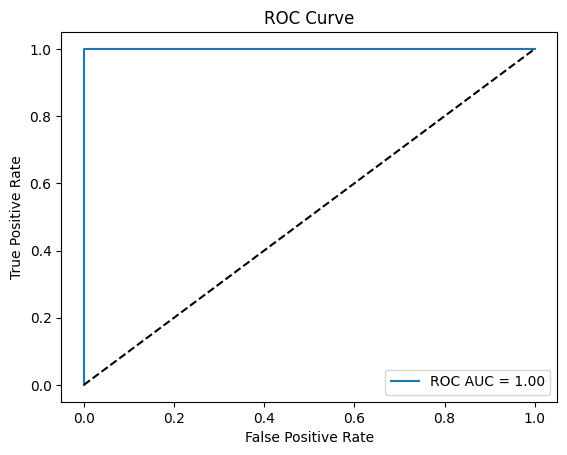

In [ ]:
y_pred = model.predict(X_test)

print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# ROC Curve
y_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

## **Cross-Validation**

In [ ]:
cv_scores = cross_val_score(model, X, y, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Average CV Score:", np.mean(cv_scores))

Cross-Validation Scores: [0.99       0.99125    0.99583333 1.         0.99875   ]
Average CV Score: 0.9951666666666666


## **Analisis Feature Importance**

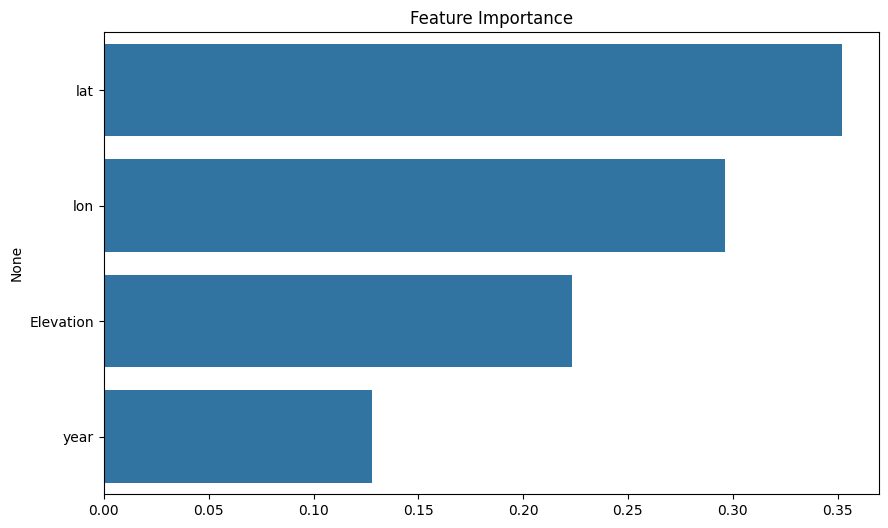

In [ ]:
importances = model.feature_importances_
feature_names = X.columns

plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=feature_names)
plt.title("Feature Importance")
plt.show()


## **Visualisasi Hasil**

In [3]:
import folium
from folium.plugins import MarkerCluster

# Buat data unik berdasarkan lat, lon, label
unique_points = df[['lat', 'lon', 'label']].drop_duplicates()

# Tentukan pusat peta
center_lat = df['lat'].mean()
center_lon = df['lon'].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=6)
marker_cluster = MarkerCluster().add_to(m)

for _, row in unique_points.iterrows():
    color = 'green' if row['label'] == 1 else 'red'
    popup_text = f"""
    Lokasi: ({row['lat']:.5f}, {row['lon']:.5f})<br>
    Label: {row['label']}
    """

    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=folium.Popup(popup_text, max_width=250)
    ).add_to(marker_cluster)

# tampilkan peta
display(m)

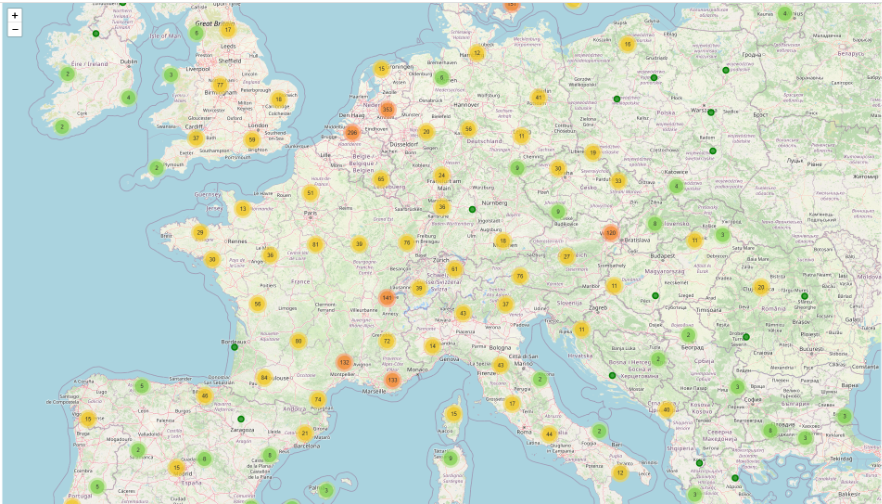

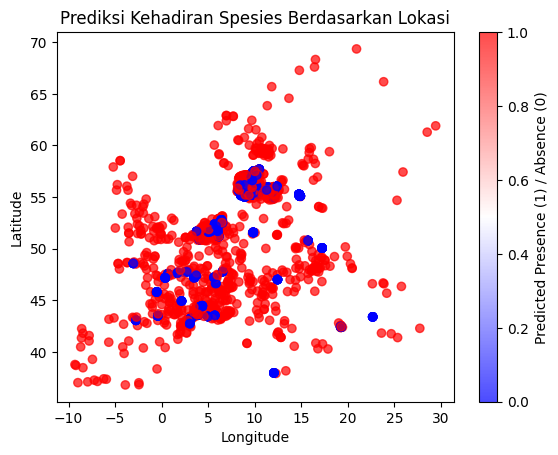

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(X_test['lon'], X_test['lat'], c=y_pred, cmap='bwr', alpha=0.7)
plt.title('Prediksi Kehadiran Spesies Berdasarkan Lokasi')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Predicted Presence (1) / Absence (0)')
plt.show()


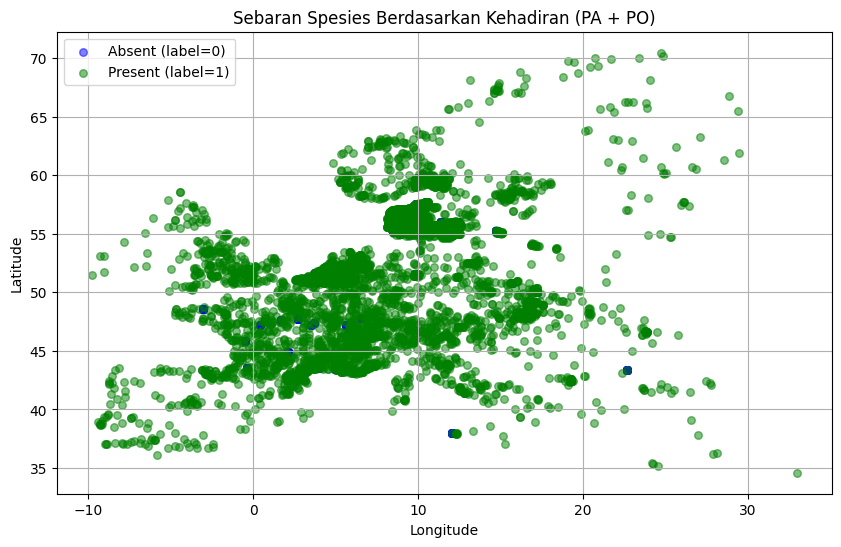

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Gunakan seluruh data dan buang yang mengandung NaN
df = df.dropna()

# Pisahkan berdasarkan label
df_present = df[df['label'] == 1]
df_absent = df[df['label'] == 0]

# Plot sebaran lokasi spesies hadir dan tidak hadir
plt.figure(figsize=(10, 6))
plt.scatter(df_absent['lon'], df_absent['lat'], c='blue', label='Absent (label=0)', alpha=0.5, s=30)
plt.scatter(df_present['lon'], df_present['lat'], c='green', label='Present (label=1)', alpha=0.5, s=30)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Sebaran Spesies Berdasarkan Kehadiran (PA + PO)')
plt.legend()
plt.grid(True)
plt.show()


## **Simpan Model**

In [ ]:
joblib.dump(model, "final_rf_model.pkl")
# joblib.dump(scaler, "final_scaler.pkl")

['final_rf_model.pkl']

In [ ]:
```from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Lanjutkan pipeline-mu dengan X_scaled, misal:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [ ]:
joblib.dump(scaler, "final_scaler.pkl")


['final_scaler.pkl']

-----